In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
import muon as mu

from muon import atac as ac
import os 
import genomicranges as gr
import iranges
lustre_path='/lustre/scratch127/cellgen/cellgeni/tickets/' + os.getcwd().split('/')[4]
lustre_path

/software/conda/users/pm19/muon/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


'/lustre/scratch127/cellgen/cellgeni/tickets/tic-3942'

# snapATAC2

In [2]:
atac = sc.read_h5ad(lustre_path+"/work/results_snapatac2_call_peaks_with_blacklist/subset_adatas/peak_mat.h5ad")
atac

AnnData object with n_obs × n_vars = 127107 × 48913
    obs: 'sample', 'leiden', 'celltype'

In [3]:
atac.X.data

array([1, 2, 1, ..., 1, 1, 2], shape=(1006687730,), dtype=uint32)

## Subset to Granulosa

In [6]:
atac = atac[atac.obs.celltype.str.startswith('Granulosa'),:].copy()
atac

AnnData object with n_obs × n_vars = 3657 × 48913
    obs: 'sample', 'leiden', 'celltype'

In [7]:
# add scANVI gene score embedding
data = sc.read_h5ad(lustre_path+'/work/scanvi_out/combined_gene_matrix_plus_ref_clean_scanvi_raw.h5ad')
data.obs_names = data.obs_names.str.replace('_atac','')
data = data[atac.obs_names,].copy()
data

AnnData object with n_obs × n_vars = 3657 × 5000
    obs: 'Sampling_site_II', 'Developmental_stage', 'coarse_annotation', 'Donor', 'Dataset', 'Sample', 'Age', 'Sampling_site', 'sample', 'dataset', 'dataset_donor', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'coarse_annotation_scanvi', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'leiden_0.5', 'leiden_1', 'leiden_2', 'leiden_3', 'tsse', 'coarse_annotation_bbknn', 'coarse_annotation_bbknn_confidence', 'log10_total_counts'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'C_scANVI_colors', 'Donor_colors', '

In [8]:
atac.obsm['X_scANVI'] = data.obsm['X_scANVI']

In [9]:
# QC and dim reduction

In [10]:
sc.pp.calculate_qc_metrics(atac, percent_top=None, log1p=False, inplace=True)

In [11]:
(atac.var.n_cells_by_counts<10).value_counts()

n_cells_by_counts
False    48356
True       557
Name: count, dtype: int64

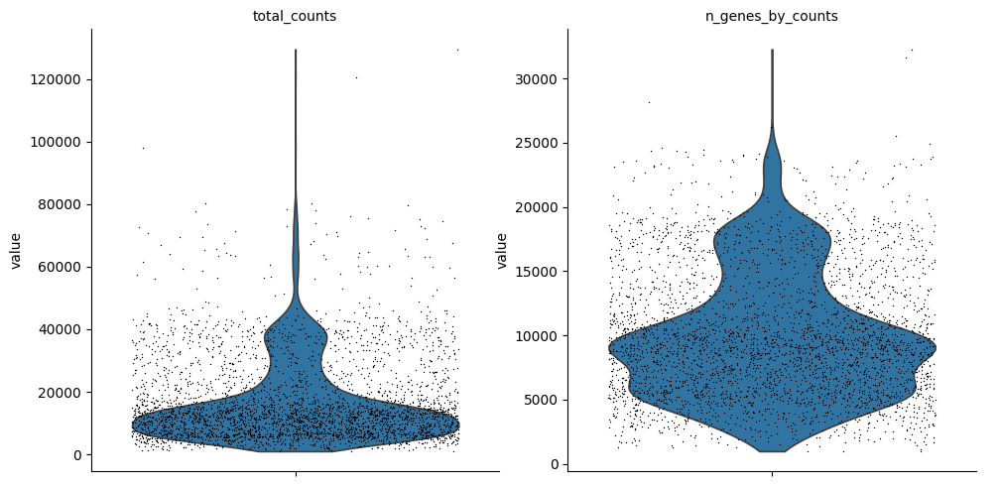

In [12]:
sc.pl.violin(atac, ['total_counts', 'n_genes_by_counts'], jitter=0.4, multi_panel=True)

In [13]:
atac.obs.total_counts.min(),atac.obs.total_counts.max()

(np.uint64(1019), np.uint64(129499))

In [14]:
atac.obs.n_genes_by_counts.min(),atac.obs.n_genes_by_counts.max()

(np.int32(987), np.int32(32281))

In [15]:
f = (atac.obs.total_counts > 4000) & (atac.obs.total_counts < 40000) & (atac.obs.n_genes_by_counts > 2000) & (atac.obs.n_genes_by_counts < 25000)
f.value_counts()

True     3244
False     413
Name: count, dtype: int64

In [16]:
pd.crosstab(atac.obs.celltype,f)

col_0,False,True
celltype,,
Granulosa_AMH_antral,0,1
Granulosa_AMH_antral_HedgLow,0,1
Granulosa_AMH_atr,0,2
Granulosa_AMH_early,16,464
Granulosa_AMH_ml,13,123
Granulosa_sq,313,2428
Granulosa_sq_atr,65,161
Granulosa_sq_transitioning,6,64


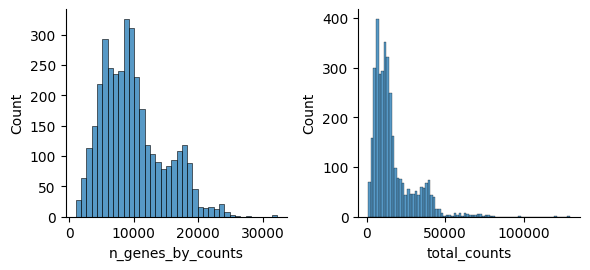

In [17]:
mu.pl.histogram(atac, ['n_genes_by_counts', 'total_counts'])

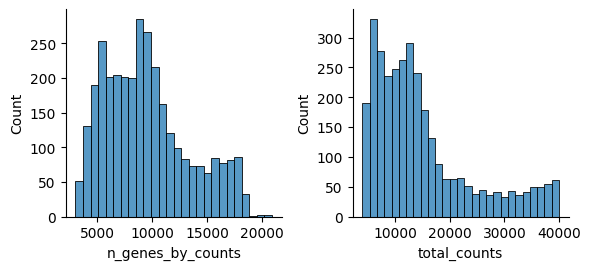

In [18]:
atac = atac[f,]
mu.pl.histogram(atac, ['n_genes_by_counts', 'total_counts'])

In [3]:
#atac.write_h5ad(lustre_path+"/work/results_snapatac2_call_peaks/subset_adatas/peak_mat_granulosa.h5ad")
atac = sc.read_h5ad(lustre_path+"/work/results_snapatac2_call_peaks/subset_adatas/peak_mat_granulosa.h5ad")

In [20]:
atac.X.data

array([1, 1, 1, ..., 2, 2, 2], shape=(30762211,), dtype=uint32)

In [21]:
#ac.pp.tfidf(atac, scale_factor=1e4)

In [22]:
sc.pp.normalize_total(atac,target_sum =1e4)
sc.pp.log1p(atac)

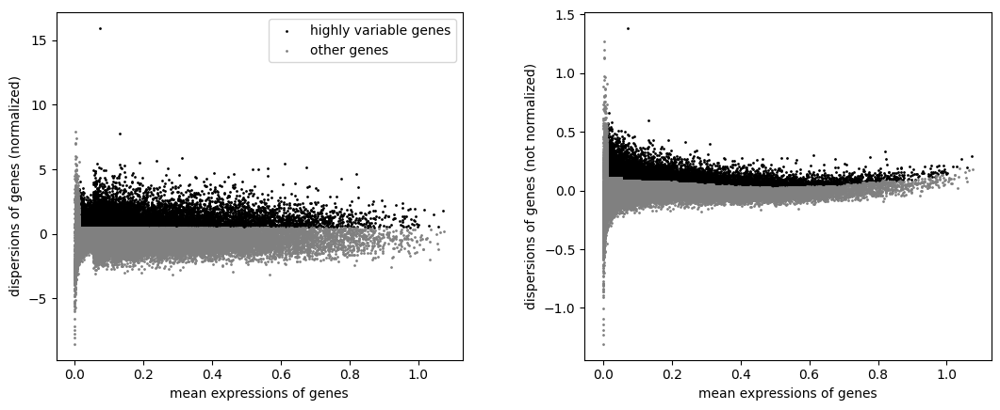

In [23]:
sc.pp.highly_variable_genes(atac)
sc.pl.highly_variable_genes(atac)

In [24]:
atac.raw = atac.copy()

In [25]:
ac.tl.lsi(atac)

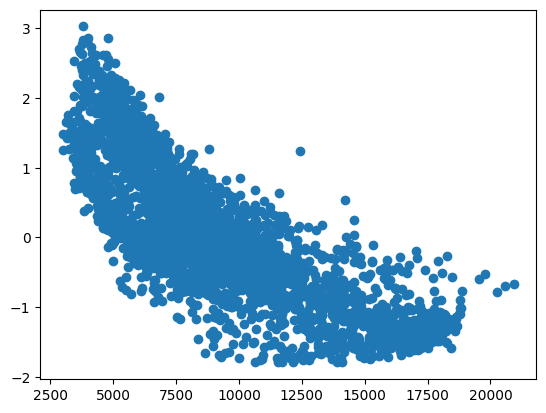

In [26]:
# remove first component as it is "typically associated with number of peaks or counts per cell "
plt.scatter(atac.obs.n_genes_by_counts,atac.obsm['X_lsi'][:,0])

In [27]:
atac.obsm['X_lsi'] = atac.obsm['X_lsi'][:,1:]
atac.varm["LSI"] = atac.varm["LSI"][:,1:]
atac.uns["lsi"]["stdev"] = atac.uns["lsi"]["stdev"][1:]

In [28]:
sc.pp.neighbors(atac, use_rep="X_lsi", n_neighbors=30, n_pcs=30)
sc.tl.umap(atac)

In [29]:
sc.pp.neighbors(atac, use_rep="X_scANVI", n_neighbors=10, n_pcs=30)
sc.tl.umap(atac,key_added='X_scANVI_umap')

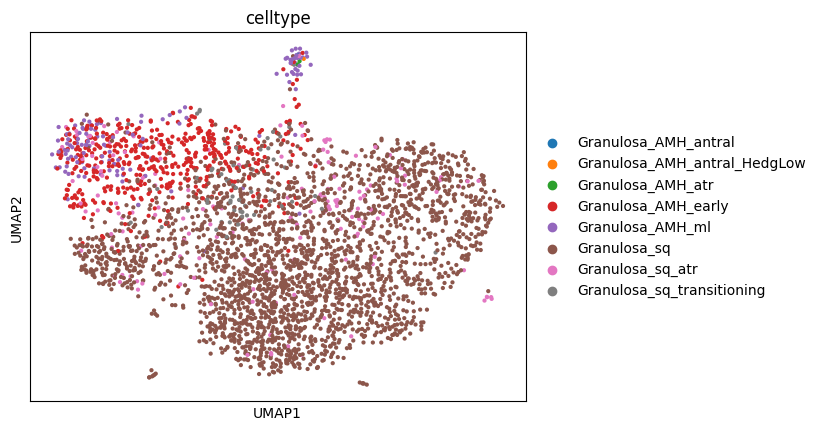

In [30]:
sc.pl.umap(atac,color=['celltype'])

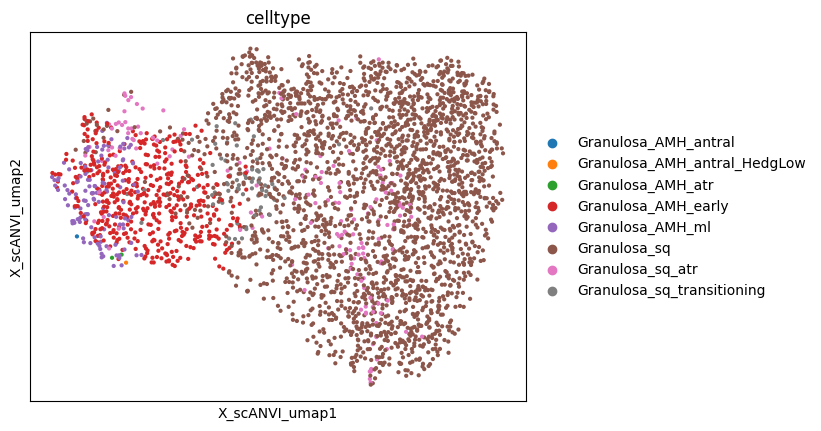

In [31]:
sc.pl.embedding(atac,color=['celltype'],basis='X_scANVI_umap')

In [32]:
atac.obs.celltype.value_counts()

celltype
Granulosa_sq                    2428
Granulosa_AMH_early              464
Granulosa_sq_atr                 161
Granulosa_AMH_ml                 123
Granulosa_sq_transitioning        64
Granulosa_AMH_atr                  2
Granulosa_AMH_antral               1
Granulosa_AMH_antral_HedgLow       1
Name: count, dtype: int64

In [9]:
samples = pd.read_csv(lustre_path+'/data/Table1-dataset_metadata - scATACseq_SangerPediatric.csv',index_col=0)
samples

,Dataset,Donor,Age,Developmental_stage,Sampling_site,Sampling_site_II,Sample_type,ion,DATE,Source ID,...,Developmental_stage.1,Tissue,Diagnosis,Sample state,Viability,10X,Comments_protocol,Sorting,Sample ID,irods
Sanger Sample ID,,,,,,,,,,,,,,,,,,,,,
HCA_P_GON_CZI12220527,Sanger_pediatric,AUrv2,15,pubertal,Cortex,Cortex_outer,cryopreserved,Paedriatic ovary,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,AUrv10-OVR-0-SC-1bmA,/seq/illumina/runs/43/43719/cellranger-atac/ce...
HCA_P_GON_CZI12220528,Sanger_pediatric,AUrv2,15,pubertal,Cortex,Cortex_outer,cryopreserved,Paedriatic ovary,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,AUrv2-OVR-0-SN-2a,/seq/illumina/runs/43/43719/cellranger-atac/ce...
HCA_P_GON_CZI13187906,Sanger_pediatric,AUrv10,10,paediatric,Cortex,Cortex_outer,cryopreserved,Paedriatic ovary,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,AUrv2-OVR-0-FO-2b,/seq/illumina/runs/46/46095/cellranger-atac/ce...
HCA_P_GON_CZI13654496,Sanger_pediatric,AUrv14,3,paediatric,Cortex,Cortex_outer,fresh,Paedriatic ovary,23/02/2023,H22/OV/1254,...,paediatric,ovary,#REF!,processed fresh,60%,ATAC,Protocol: Ovary Tissue dissociation V2,Live/Dead,AUrv14-OVR-0-SC-FACS-2,/seq/illumina/runs/47/47082/cellranger-atac/ce...
HCA_P_GON_CZI13737937,Sanger_pediatric,AUrv15,13,pubertal,Cortex,Cortex_outer,fresh,Paedriatic ovary,30/03/2023,H23/OV/1327,...,paediatric,ovary,#REF!,processed fresh,66%,ATAC,Protocol: Ovary Tissue dissociation V2,Live/Dead,AUrv15-OVR-0-SC-FACS-3,/seq/illumina/runs/47/47290/cellranger-atac/ce...
HCA_P_GON_CZI13941754,Sanger_pediatric,AUrv16,14,pubertal,Cortex,Cortex_outer,fresh,Paedriatic ovary,12/05/2023,H23/OV/1331,...,paediatric,ovary,#REF!,processed fresh,34% before sorter,ATAC,Protocol: Ovary Tissue dissociation V2,Live/Dead 77%,AU16-OVR-0-SC-FACS-2,/seq/illumina/runs/47/47776/cellranger-atac/ce...
HCA_P_GON_CZI13941755,Sanger_pediatric,AUrv17,5,paediatric,Cortex,Cortex_outer_inner,fresh,Paedriatic ovary,26/05/2023,H23/OV/1354,...,paediatric,ovary,NaN,processed fresh,60% before sorter,ATAC,Protocol: Ovary Tissue dissociation V2,Live/Dead 91%,AU17-OVR-0-SC-FACS-2,/seq/illumina/runs/47/47776/cellranger-atac/ce...
HCA_P_GON_CZI13941756,Sanger_pediatric,AUrv18,2,paediatric,Cortex,Cortex_outer_inner,fresh,Paedriatic ovary,07/06/2023,H23/OV/1363,...,paediatric,ovary,#REF!,processed fresh,35% before sorter,ATAC v2,Protocol: Ovary Tissue dissociation V2,Live/Dead 90%,AU18-OVR-0-SC-FACS-2,/seq/illumina/runs/47/47776/cellranger-atac/ce...
HCA_P_GON_CZI13941757,Sanger_pediatric,AUrv20,15,pubertal,Cortex,Cortex_outer,fresh,Paedriatic ovary,06/07/2023,H23/OV/1378,...,paediatric,ovary,#REF!,processed fresh,50% before sorter,ATAC v2,Protocol: Ovary Tissue dissociation V2,Live/Dead 85%,AU20-OVR-0-SC-FACS-3,/seq/illumina/runs/47/47776/cellranger-atac/ce...


In [8]:
categories_order = ['Granulosa_sq','Granulosa_sq_atr','Granulosa_sq_transitioning','Granulosa_AMH_early','Granulosa_AMH_ml']
pd.crosstab(atac.obs['sample'],atac.obs.celltype).loc[:,categories_order]

celltype,Granulosa_sq,Granulosa_sq_atr,Granulosa_sq_transitioning,Granulosa_AMH_early,Granulosa_AMH_ml
sample,,,,,
HCA_P_GON_CZI12220527,19,4,0,0,0
HCA_P_GON_CZI12220528,3,0,0,0,0
HCA_P_GON_CZI13187906,6,0,0,6,0
HCA_P_GON_CZI13654496,96,38,8,209,67
HCA_P_GON_CZI13737937,20,1,0,19,8
HCA_P_GON_CZI13941754,110,4,0,7,0
HCA_P_GON_CZI13941755,60,0,2,22,3
HCA_P_GON_CZI13941756,22,16,6,19,32
HCA_P_GON_CZI13941757,1,1,2,6,0


In [13]:
x=list(samples.loc[atac.obs['sample'],'Developmental_stage'])
pd.crosstab(x,atac.obs.celltype).loc[:,categories_order]

celltype,Granulosa_sq,Granulosa_sq_atr,Granulosa_sq_transitioning,Granulosa_AMH_early,Granulosa_AMH_ml
row_0,,,,,
paediatric,2082,133,53,355,113
postpubertal,4,2,1,7,0
pubertal,342,26,10,102,10


In [15]:
x=list(samples.loc[atac.obs['sample'],'Age'])
pd.crosstab(x,atac.obs.celltype).loc[:,categories_order]

celltype,Granulosa_sq,Granulosa_sq_atr,Granulosa_sq_transitioning,Granulosa_AMH_early,Granulosa_AMH_ml
row_0,,,,,
1,55,14,1,6,0
2,22,16,6,19,32
3,96,38,8,209,67
5,584,42,4,37,7
6,22,2,5,20,7
7,1297,21,29,58,0
10,60,1,3,12,0
11,42,12,2,39,1
13,50,2,0,24,8


## DARs

In [33]:
sc.tl.rank_genes_groups(atac,groupby='celltype',
                        groups=['Granulosa_sq','Granulosa_AMH_early','Granulosa_sq_atr','Granulosa_AMH_ml','Granulosa_sq_transitioning'],
                        test='wilcox',pts=True,use_raw=True)

In [34]:
markers = sc.get.rank_genes_groups_df(atac,group=None)
markers

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
0,Granulosa_sq,chr6:112562433-112562934,27.724682,2.529666,5.584338e-146,2.731691e-141,0.614498,0.133578
1,Granulosa_sq,chr17:8420231-8420732,24.807043,3.208147,7.581596e-124,1.854345e-119,0.402389,0.042892
2,Granulosa_sq,chr18:58828334-58828835,23.452438,2.341442,2.667901e-109,4.350190e-105,0.524300,0.120098
3,Granulosa_sq,chr21:39023231-39023732,21.295227,2.348202,3.192921e-92,3.904703e-88,0.460873,0.099265
4,Granulosa_sq,chr5:149406492-149406993,20.538692,2.109268,3.176797e-86,3.107988e-82,0.483114,0.139706
...,...,...,...,...,...,...,...,...
244580,Granulosa_sq_transitioning,chr1:41474611-41475112,-22.848118,-26.625900,4.130948e-107,4.041472e-103,0.000000,0.167925
244581,Granulosa_sq_transitioning,chr5:147743571-147744072,-23.132025,-26.564592,1.516794e-109,1.854925e-105,0.000000,0.166981
244582,Granulosa_sq_transitioning,chr7:29465502-29466003,-23.672625,-26.703951,3.058735e-114,4.987472e-110,0.000000,0.181132
244583,Granulosa_sq_transitioning,chr11:79852625-79853126,-25.473600,-27.046978,2.040109e-130,4.989802e-126,0.000000,0.203459


In [35]:
markers[(markers.pvals_adj<0.05) & (markers.logfoldchanges > 2) & markers.pct_nz_group> 0.2]

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
0,Granulosa_sq,chr6:112562433-112562934,27.724682,2.529666,5.584338e-146,2.731691e-141,0.614498,0.133578
1,Granulosa_sq,chr17:8420231-8420732,24.807043,3.208147,7.581596e-124,1.854345e-119,0.402389,0.042892
2,Granulosa_sq,chr18:58828334-58828835,23.452438,2.341442,2.667901e-109,4.350190e-105,0.524300,0.120098
3,Granulosa_sq,chr21:39023231-39023732,21.295227,2.348202,3.192921e-92,3.904703e-88,0.460873,0.099265
4,Granulosa_sq,chr5:149406492-149406993,20.538692,2.109268,3.176797e-86,3.107988e-82,0.483114,0.139706
...,...,...,...,...,...,...,...,...
195720,Granulosa_sq_transitioning,chr11:73157427-73157928,3.130599,2.294490,2.633431e-03,1.759109e-02,0.218750,0.049057
195774,Granulosa_sq_transitioning,chr20:279157-279658,2.821700,2.052745,6.362393e-03,3.855186e-02,0.203125,0.054403
195780,Granulosa_sq_transitioning,chr3:26598658-26599159,2.801951,2.827130,6.728929e-03,4.044716e-02,0.156250,0.027673
195786,Granulosa_sq_transitioning,chr1:53971733-53972234,2.768034,2.294119,7.381357e-03,4.389422e-02,0.187500,0.053459


In [36]:
#top5 = markers[(markers.pvals_adj<0.05) & (markers.logfoldchanges > 2) & (markers.pct_nz_group> 0.3) & (markers.pct_nz_reference<0.1)].groupby('group').head(5)
top5 = markers[(markers.pvals_adj<0.01) & (markers.logfoldchanges > 2)].groupby('group').head(5)
top5

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
0,Granulosa_sq,chr6:112562433-112562934,27.724682,2.529666,5.584338e-146,2.731691e-141,0.614498,0.133578
1,Granulosa_sq,chr17:8420231-8420732,24.807043,3.208147,7.581596e-124,1.854345e-119,0.402389,0.042892
2,Granulosa_sq,chr18:58828334-58828835,23.452438,2.341442,2.667901e-109,4.350190e-105,0.524300,0.120098
3,Granulosa_sq,chr21:39023231-39023732,21.295227,2.348202,3.192921e-92,3.904703e-88,0.460873,0.099265
4,Granulosa_sq,chr5:149406492-149406993,20.538692,2.109268,3.176797e-86,3.107988e-82,0.483114,0.139706
48917,Granulosa_AMH_early,chr22:22559058-22559559,12.748835,2.227203,1.495490e-32,1.866196e-30,0.454741,0.126978
48918,Granulosa_AMH_early,chr19:8367313-8367814,12.048816,2.007194,1.116597e-29,1.177168e-27,0.443966,0.146763
48919,Granulosa_AMH_early,chr20:51022947-51023448,11.326223,2.442520,1.227891e-26,1.090105e-24,0.362069,0.090647
48923,Granulosa_AMH_early,chr16:18983635-18984136,9.676194,2.162203,1.977048e-20,1.177969e-18,0.310345,0.088129
48924,Granulosa_AMH_early,chr17:76480554-76481055,9.557272,2.262193,5.280654e-20,3.031852e-18,0.293103,0.075540


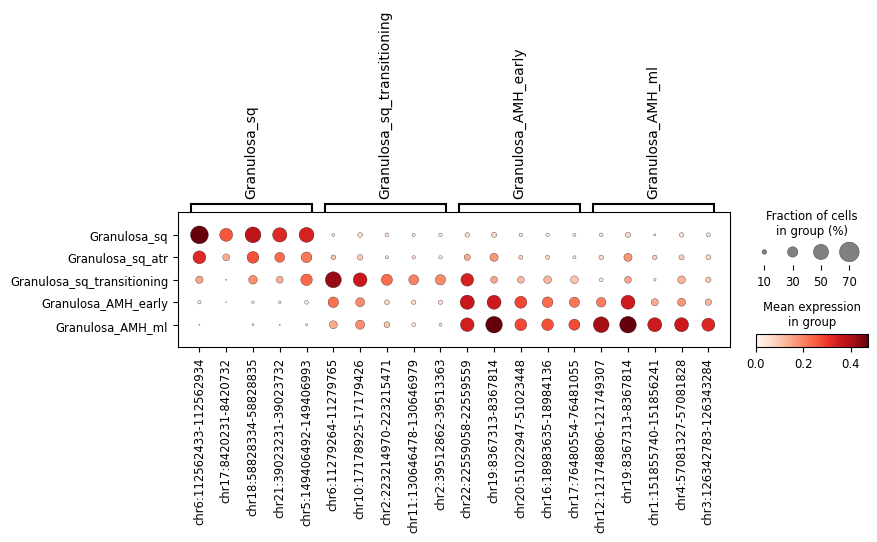

In [37]:
categories_order = ['Granulosa_sq','Granulosa_sq_atr','Granulosa_sq_transitioning','Granulosa_AMH_early','Granulosa_AMH_ml']
peaks = {g:top5.names[top5.group==g] for g in categories_order if (top5.group==g).sum(0)>0}
sc.pl.dotplot(atac[atac.obs.celltype.isin(categories_order)],peaks,groupby='celltype',categories_order=categories_order)

In [38]:
peaksn = []
for v in peaks.values():
    peaksn.extend(v)    

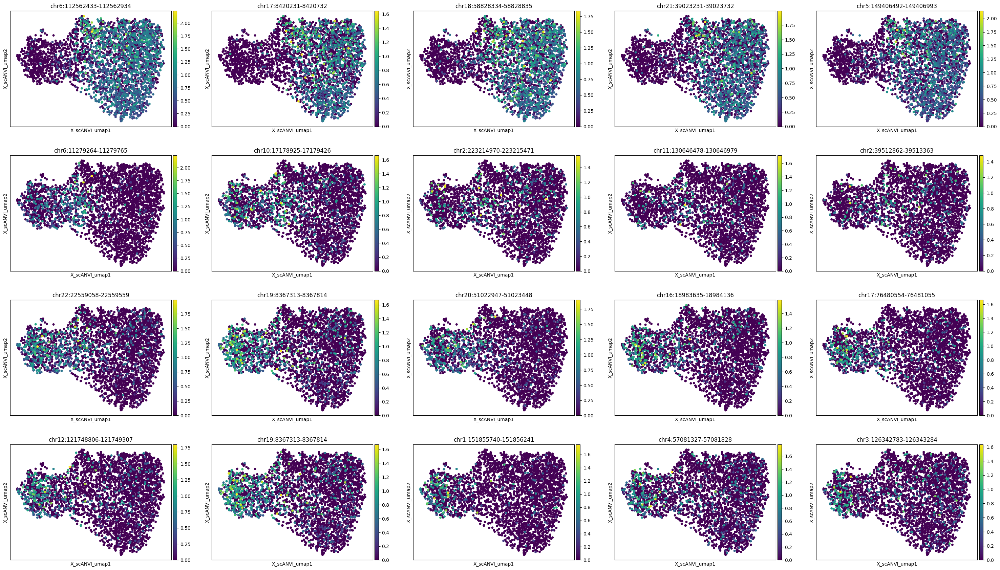

In [39]:
sc.pl.embedding(atac,color=peaksn,basis='X_scANVI_umap',size=100,sort_order=True,ncols=5)

In [40]:
markers[(markers.pvals_adj<0.05) & (markers.logfoldchanges > np.log(2))].to_csv('snapatac2_granulosa_dars.csv')
markers = pd.read_csv('snapatac2_granulosa_dars.csv',index_col=0)
markers 

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
0,Granulosa_sq,chr6:112562433-112562934,27.724682,2.529666,5.584338e-146,2.731691e-141,0.614498,0.133578
1,Granulosa_sq,chr17:8420231-8420732,24.807043,3.208147,7.581596e-124,1.854345e-119,0.402389,0.042892
2,Granulosa_sq,chr18:58828334-58828835,23.452438,2.341442,2.667901e-109,4.350190e-105,0.524300,0.120098
3,Granulosa_sq,chr21:39023231-39023732,21.295227,2.348202,3.192921e-92,3.904703e-88,0.460873,0.099265
4,Granulosa_sq,chr5:149406492-149406993,20.538692,2.109268,3.176797e-86,3.107988e-82,0.483114,0.139706
...,...,...,...,...,...,...,...,...
195795,Granulosa_sq_transitioning,chr4:154361439-154361940,2.733600,2.176827,8.105362e-03,4.754934e-02,0.218750,0.057862
195797,Granulosa_sq_transitioning,chr1:16895976-16896477,2.732415,0.804036,8.095196e-03,4.750962e-02,0.515625,0.370440
195798,Granulosa_sq_transitioning,chr1:203572034-203572535,2.723472,0.912784,8.300544e-03,4.859235e-02,0.468750,0.312579
195800,Granulosa_sq_transitioning,chr13:110601894-110602395,2.719562,1.297375,8.403289e-03,4.914679e-02,0.296875,0.168553


# pycistopic

In [2]:
patac = sc.read_h5ad(lustre_path+'/work/pycistopic/results_pycistopic_call_peaks/combined.h5ad')
del patac.layers['binary']
patac.obs_names = patac.obs.sample_id.astype(str) +":"+patac.obs.barcode.astype(str)
patac

AnnData object with n_obs × n_vars = 144106 × 645326
    obs: 'cisTopic_nr_frag', 'cisTopic_log_nr_frag', 'cisTopic_nr_acc', 'cisTopic_log_nr_acc', 'sample_id', 'barcode_rank', 'total_fragments_count', 'log10_total_fragments_count', 'unique_fragments_count', 'log10_unique_fragments_count', 'total_fragments_in_peaks_count', 'log10_total_fragments_in_peaks_count', 'unique_fragments_in_peaks_count', 'log10_unique_fragments_in_peaks_count', 'fraction_of_fragments_in_peaks', 'duplication_count', 'duplication_ratio', 'nucleosome_signal', 'tss_enrichment', 'pdf_values_for_tss_enrichment', 'pdf_values_for_fraction_of_fragments_in_peaks', 'pdf_values_for_duplication_ratio', 'barcode'

In [3]:
celltype = pd.read_csv(lustre_path+'/work/scanvi_out/combined_gene_matrix_plus_ref_clean_scanvi_raw_obs.csv')
celltype.index = celltype.sample_id +":"+celltype.barcode
celltype

,sample_id,barcode,celltype
HCA_P_GON_CZI14524754:AAACGAAGTACGCCCA-1,HCA_P_GON_CZI14524754,AAACGAAGTACGCCCA-1,Stroma_InnCor
HCA_P_GON_CZI14524754:AAACGAATCGCTTGAA-1,HCA_P_GON_CZI14524754,AAACGAATCGCTTGAA-1,Stroma_OutCor_Foll
HCA_P_GON_CZI14524754:AAACGAATCTTTGCAT-1,HCA_P_GON_CZI14524754,AAACGAATCTTTGCAT-1,Stroma_Perifoll_InnCor
HCA_P_GON_CZI14524754:AAACTCGCAAATTGAG-1,HCA_P_GON_CZI14524754,AAACTCGCAAATTGAG-1,Theca_1perifollicular
HCA_P_GON_CZI14524754:AAACTCGGTTAGGCTT-1,HCA_P_GON_CZI14524754,AAACTCGGTTAGGCTT-1,Stroma_InnCor
...,...,...,...
HCA_P_GON_CZI14609780:TTTGTGTGTCTGAGCC-1,HCA_P_GON_CZI14609780,TTTGTGTGTCTGAGCC-1,Stroma_OutCor_Foll
HCA_P_GON_CZI14609780:TTTGTGTGTGGTCGAA-1,HCA_P_GON_CZI14609780,TTTGTGTGTGGTCGAA-1,Stroma_OutCor_Foll
HCA_P_GON_CZI14609780:TTTGTGTGTTCAGTTG-1,HCA_P_GON_CZI14609780,TTTGTGTGTTCAGTTG-1,PV_SMC_Arterial
HCA_P_GON_CZI14609780:TTTGTGTGTTTCCTAT-1,HCA_P_GON_CZI14609780,TTTGTGTGTTTCCTAT-1,Stroma_OutCor_Foll


In [4]:
pd.Series(patac.obs_names.isin(celltype.index)).value_counts()

True     125936
False     18170
Name: count, dtype: int64

In [5]:
pd.Series(celltype.index.isin(patac.obs_names)).value_counts()

True     125936
False      1171
Name: count, dtype: int64

In [11]:
cmn = list(set(celltype.index).intersection(set(patac.obs_names)))
celltype = celltype.loc[cmn,:]
patac = patac[cmn,]
patac.obs['celltype'] = celltype.celltype

/tmp/ipykernel_2247066/2677485579.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patac.obs['celltype'] = celltype.celltype


In [12]:
patac.var

""
RegionIDs
chr1:831862-832362
chr1:833362-833862
chr1:834121-834621
chr1:874429-874929
chr1:879007-879507
...
chrX:40166524-40167024
chrX:154357329-154357829
chrX:25007837-25008337


## Subset to Granulosa

In [13]:
patac = patac[patac.obs.celltype.str.startswith('Granulosa'),:].copy()
patac

AnnData object with n_obs × n_vars = 3636 × 645326
    obs: 'cisTopic_nr_frag', 'cisTopic_log_nr_frag', 'cisTopic_nr_acc', 'cisTopic_log_nr_acc', 'sample_id', 'barcode_rank', 'total_fragments_count', 'log10_total_fragments_count', 'unique_fragments_count', 'log10_unique_fragments_count', 'total_fragments_in_peaks_count', 'log10_total_fragments_in_peaks_count', 'unique_fragments_in_peaks_count', 'log10_unique_fragments_in_peaks_count', 'fraction_of_fragments_in_peaks', 'duplication_count', 'duplication_ratio', 'nucleosome_signal', 'tss_enrichment', 'pdf_values_for_tss_enrichment', 'pdf_values_for_fraction_of_fragments_in_peaks', 'pdf_values_for_duplication_ratio', 'barcode', 'celltype'

In [14]:
# add scANVI gene score embedding
data = sc.read_h5ad(lustre_path+'/work/scanvi_out/combined_gene_matrix_plus_ref_clean_scanvi_raw.h5ad')
data.obs_names = data.obs_names.str.replace('_atac','')
data = data[patac.obs_names,].copy()
data

AnnData object with n_obs × n_vars = 3636 × 5000
    obs: 'Sampling_site_II', 'Developmental_stage', 'coarse_annotation', 'Donor', 'Dataset', 'Sample', 'Age', 'Sampling_site', 'sample', 'dataset', 'dataset_donor', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'coarse_annotation_scanvi', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'leiden_0.5', 'leiden_1', 'leiden_2', 'leiden_3', 'tsse', 'coarse_annotation_bbknn', 'coarse_annotation_bbknn_confidence', 'log10_total_counts'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'C_scANVI_colors', 'Donor_colors', '

In [15]:
patac.obsm['X_scANVI'] = data.obsm['X_scANVI']

In [10]:
# QC and dim reduction

In [16]:
sc.pp.calculate_qc_metrics(patac, percent_top=None, log1p=False, inplace=True)

In [20]:
(patac.var.n_cells_by_counts<10).value_counts()
patac = patac[:,patac.var.n_cells_by_counts>=10]
patac

View of AnnData object with n_obs × n_vars = 3636 × 546631
    obs: 'cisTopic_nr_frag', 'cisTopic_log_nr_frag', 'cisTopic_nr_acc', 'cisTopic_log_nr_acc', 'sample_id', 'barcode_rank', 'total_fragments_count', 'log10_total_fragments_count', 'unique_fragments_count', 'log10_unique_fragments_count', 'total_fragments_in_peaks_count', 'log10_total_fragments_in_peaks_count', 'unique_fragments_in_peaks_count', 'log10_unique_fragments_in_peaks_count', 'fraction_of_fragments_in_peaks', 'duplication_count', 'duplication_ratio', 'nucleosome_signal', 'tss_enrichment', 'pdf_values_for_tss_enrichment', 'pdf_values_for_fraction_of_fragments_in_peaks', 'pdf_values_for_duplication_ratio', 'barcode', 'celltype', 'n_genes_by_counts', 'total_counts'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    obsm: 'X_scANVI'

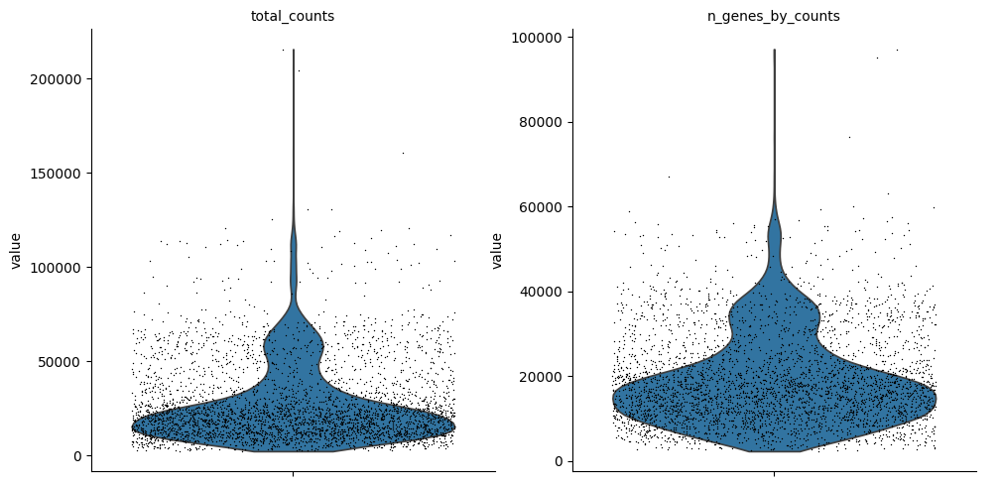

In [21]:
sc.pl.violin(patac, ['total_counts', 'n_genes_by_counts'], jitter=0.4, multi_panel=True)

In [23]:
patac.obs.total_counts.min(),patac.obs.total_counts.max()

(np.int64(2394), np.int64(215687))

In [24]:
patac.obs.n_genes_by_counts.min(),patac.obs.n_genes_by_counts.max()

(np.int32(2323), np.int32(97104))

In [26]:
f = (patac.obs.total_counts > 4000) & (patac.obs.total_counts < 100000) & (patac.obs.n_genes_by_counts > 2000) & (patac.obs.n_genes_by_counts < 50000)
f.value_counts()

True     3541
False      95
Name: count, dtype: int64

In [28]:
pd.crosstab(patac.obs.celltype,f)

col_0,False,True
celltype,,
Granulosa_AMH_antral,0,1
Granulosa_AMH_antral_HedgLow,0,1
Granulosa_AMH_atr,0,2
Granulosa_AMH_early,0,480
Granulosa_AMH_ml,2,134
Granulosa_sq,77,2654
Granulosa_sq_atr,15,200
Granulosa_sq_transitioning,1,69


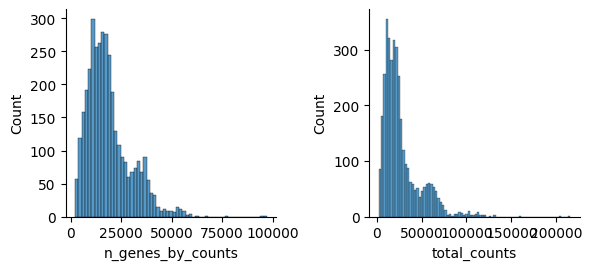

In [29]:
mu.pl.histogram(patac, ['n_genes_by_counts', 'total_counts'])

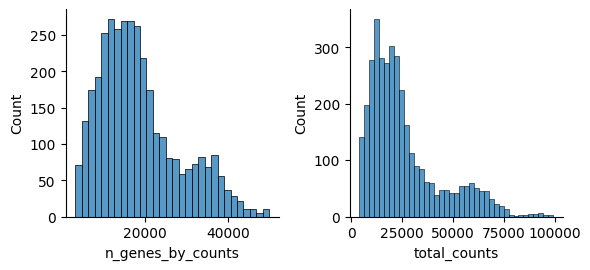

In [30]:
patac = patac[f,]
mu.pl.histogram(patac, ['n_genes_by_counts', 'total_counts'])

In [32]:
#patac.write_h5ad(lustre_path+"/work/pycistopic/results_pycistopic_call_peaks/combined_granulosa.h5ad")
patac = sc.read_h5ad(lustre_path+"/work/pycistopic/results_pycistopic_call_peaks/combined_granulosa.h5ad")

In [34]:
patac.X.data

array([1, 1, 1, ..., 1, 1, 1], shape=(64905557,), dtype=int32)

In [100]:
#ac.pp.tfidf(atac, scale_factor=1e4)

In [35]:
sc.pp.normalize_total(patac,target_sum =1e4)
sc.pp.log1p(patac)

/software/conda/users/pm19/muon/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:269: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


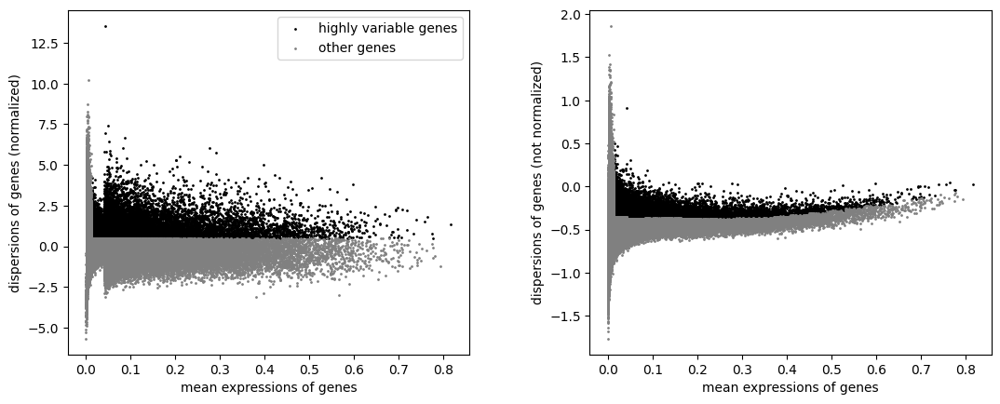

In [36]:
sc.pp.highly_variable_genes(patac)
sc.pl.highly_variable_genes(patac)

In [37]:
patac.raw = patac.copy()

In [38]:
ac.tl.lsi(patac)

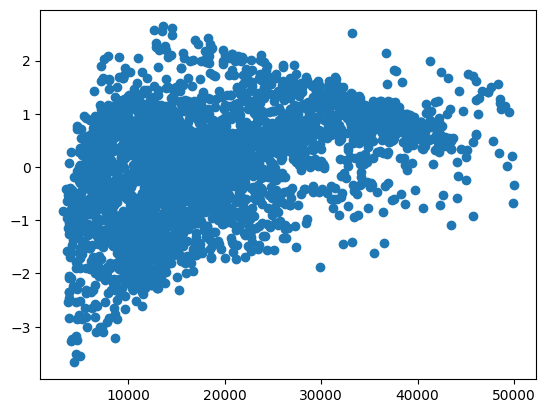

In [40]:
# remove first component as it is "typically associated with number of peaks or counts per cell "
plt.scatter(patac.obs.n_genes_by_counts,patac.obsm['X_lsi'][:,0])

In [106]:
#atac.obsm['X_lsi'] = atac.obsm['X_lsi'][:,1:]
#atac.varm["LSI"] = atac.varm["LSI"][:,1:]
#atac.uns["lsi"]["stdev"] = atac.uns["lsi"]["stdev"][1:]

In [42]:
sc.pp.neighbors(patac, use_rep="X_lsi", n_neighbors=30, n_pcs=30)
sc.tl.umap(patac)

In [43]:
sc.pp.neighbors(patac, use_rep="X_scANVI", n_neighbors=10, n_pcs=30)
sc.tl.umap(patac,key_added='X_scANVI_umap')

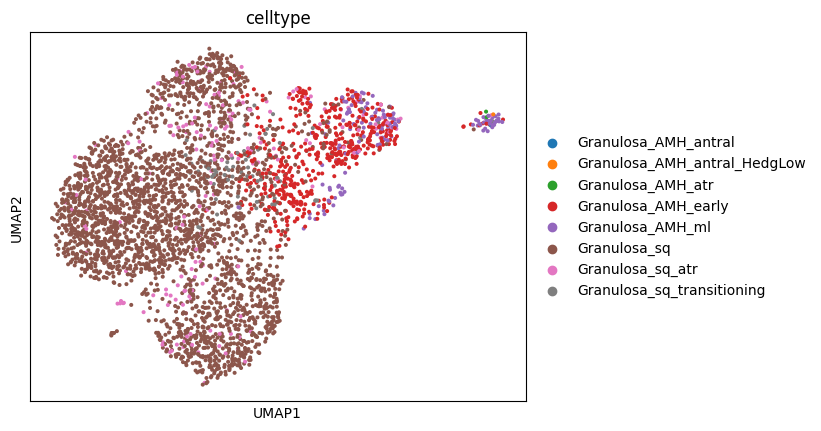

In [45]:
sc.pl.umap(patac,color=['celltype'])

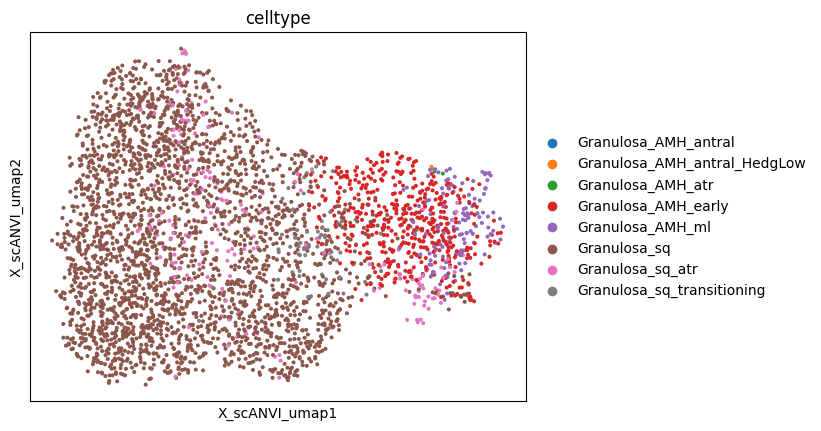

In [46]:
sc.pl.embedding(patac,color=['celltype'],basis='X_scANVI_umap')

In [47]:
patac.obs.celltype.value_counts()

celltype
Granulosa_sq                    2654
Granulosa_AMH_early              480
Granulosa_sq_atr                 200
Granulosa_AMH_ml                 134
Granulosa_sq_transitioning        69
Granulosa_AMH_atr                  2
Granulosa_AMH_antral               1
Granulosa_AMH_antral_HedgLow       1
Name: count, dtype: int64

## DARs

In [48]:
sc.tl.rank_genes_groups(patac,groupby='celltype',
                        groups=['Granulosa_sq','Granulosa_AMH_early','Granulosa_sq_atr','Granulosa_AMH_ml','Granulosa_sq_transitioning'],
                        test='wilcox',pts=True,use_raw=True)

In [49]:
pmarkers = sc.get.rank_genes_groups_df(patac,group=None)
pmarkers

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
0,Granulosa_sq,chr6:112562420-112562920,26.773146,2.356550,2.085181e-138,1.139825e-132,0.624341,0.144307
1,Granulosa_sq,chr18:58828416-58828916,24.066765,2.262306,2.659003e-115,7.267468e-110,0.545968,0.127396
2,Granulosa_sq,chr16:6618934-6619434,23.042984,2.825855,6.479244e-109,1.180585e-103,0.394499,0.062007
3,Granulosa_sq,chr17:8430907-8431407,21.609949,2.806904,1.668330e-96,2.277000e-91,0.386209,0.060879
4,Granulosa_sq,chr5:74540918-74541418,21.579323,2.692926,2.527750e-96,2.302911e-91,0.384326,0.058625
...,...,...,...,...,...,...,...,...
2733150,Granulosa_sq_transitioning,chr1:95201869-95202369,-26.921755,-26.514563,3.799701e-145,4.154069e-140,0.000000,0.220046
2733151,Granulosa_sq_transitioning,chr1:58592462-58592962,-26.997458,-26.464993,7.012368e-146,9.582944e-141,0.000000,0.217742
2733152,Granulosa_sq_transitioning,chr7:16982970-16983470,-27.518496,-26.578468,5.735725e-151,1.045108e-145,0.000000,0.226959
2733153,Granulosa_sq_transitioning,chr2:160317330-160317830,-28.788589,-26.827047,1.262392e-163,3.450313e-158,0.000000,0.252880


In [53]:
pmarkers[(pmarkers.pvals_adj<0.05) & (pmarkers.logfoldchanges > 2) & (pmarkers.pct_nz_group> 0.2)]

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
0,Granulosa_sq,chr6:112562420-112562920,26.773146,2.356550,2.085181e-138,1.139825e-132,0.624341,0.144307
1,Granulosa_sq,chr18:58828416-58828916,24.066765,2.262306,2.659003e-115,7.267468e-110,0.545968,0.127396
2,Granulosa_sq,chr16:6618934-6619434,23.042984,2.825855,6.479244e-109,1.180585e-103,0.394499,0.062007
3,Granulosa_sq,chr17:8430907-8431407,21.609949,2.806904,1.668330e-96,2.277000e-91,0.386209,0.060879
4,Granulosa_sq,chr5:74540918-74541418,21.579323,2.692926,2.527750e-96,2.302911e-91,0.384326,0.058625
...,...,...,...,...,...,...,...,...
2186704,Granulosa_sq_transitioning,chr3:75559388-75559888,2.885904,2.065576,5.212237e-03,9.701311e-03,0.202899,0.064804
2186723,Granulosa_sq_transitioning,chr22:17059725-17060225,2.826787,2.249554,6.155159e-03,1.130415e-02,0.217391,0.048675
2186767,Granulosa_sq_transitioning,chr3:50376845-50377345,2.742529,2.192034,7.774727e-03,1.407193e-02,0.202899,0.071429
2186768,Granulosa_sq_transitioning,chr5:165352913-165353413,2.739538,2.865856,7.842688e-03,1.418874e-02,0.202899,0.037730


In [52]:
#top5 = markers[(markers.pvals_adj<0.05) & (markers.logfoldchanges > 2) & (markers.pct_nz_group> 0.3) & (markers.pct_nz_reference<0.1)].groupby('group').head(5)
ptop5 = pmarkers[(pmarkers.pvals_adj<0.01) & (pmarkers.logfoldchanges > 2)].groupby('group').head(5)
ptop5

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
0,Granulosa_sq,chr6:112562420-112562920,26.773146,2.356550,2.085181e-138,1.139825e-132,0.624341,0.144307
1,Granulosa_sq,chr18:58828416-58828916,24.066765,2.262306,2.659003e-115,7.267468e-110,0.545968,0.127396
2,Granulosa_sq,chr16:6618934-6619434,23.042984,2.825855,6.479244e-109,1.180585e-103,0.394499,0.062007
3,Granulosa_sq,chr17:8430907-8431407,21.609949,2.806904,1.668330e-96,2.277000e-91,0.386209,0.060879
4,Granulosa_sq,chr5:74540918-74541418,21.579323,2.692926,2.527750e-96,2.302911e-91,0.384326,0.058625
546631,Granulosa_AMH_early,chr22:22559108-22559608,12.848044,2.178482,4.203978e-33,1.829637e-30,0.466667,0.126756
546633,Granulosa_AMH_early,chr20:51022936-51023436,11.424268,2.391138,4.118844e-27,1.232341e-24,0.370833,0.093760
546636,Granulosa_AMH_early,chr16:18983678-18984178,9.931980,2.166413,2.129445e-21,4.336887e-19,0.320833,0.089840
546640,Granulosa_AMH_early,chr1:200038614-200039114,9.615217,2.090898,2.922189e-20,5.504339e-18,0.310417,0.098007
546641,Granulosa_AMH_early,chr19:45276092-45276592,9.495439,2.024577,7.692823e-20,1.406400e-17,0.312500,0.098334


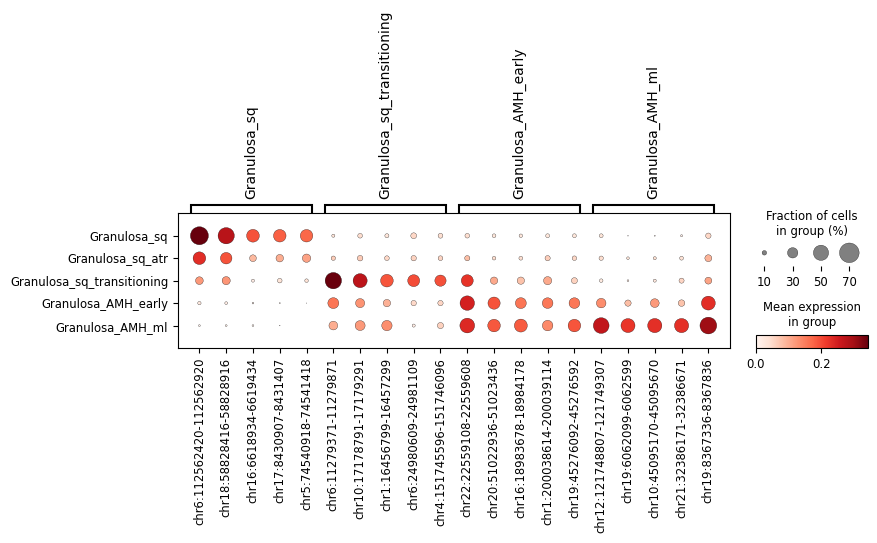

In [58]:
categories_order = ['Granulosa_sq','Granulosa_sq_atr','Granulosa_sq_transitioning','Granulosa_AMH_early','Granulosa_AMH_ml']
peaks = {g:ptop5.names[ptop5.group==g] for g in categories_order if (ptop5.group==g).sum(0)>0}
sc.pl.dotplot(patac[patac.obs.celltype.isin(categories_order)],peaks,groupby='celltype',categories_order=categories_order)

In [59]:
peaksn = []
for v in peaks.values():
    peaksn.extend(v)    

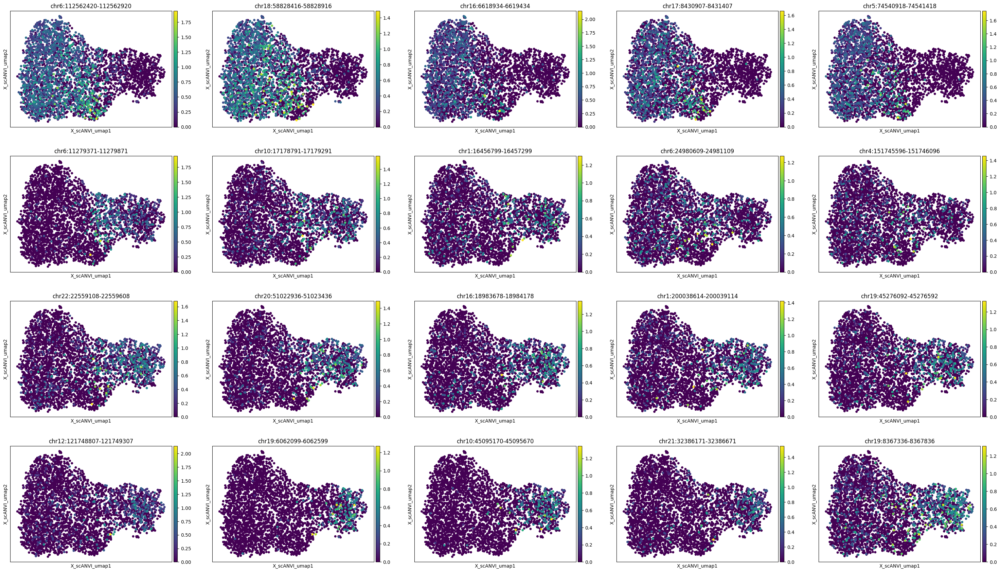

In [60]:
sc.pl.embedding(patac,color=peaksn,basis='X_scANVI_umap',size=100,sort_order=True,ncols=5)

In [62]:
pmarkers[(pmarkers.pvals_adj<0.05) & (pmarkers.logfoldchanges > np.log(2))].to_csv('pycistopic_granulosa_dars.csv')

# Match snapatac2 and pycistopic peaks

In [65]:
def coor2GRanges(coors):
    peaks = coors.str.split('[:-]')
    starts = [int(p[1]) for p in peaks]
    width= [int(p[2]) - int(p[1]) + 1 for p in peaks]
    peaks = gr.GenomicRanges(
        seqnames = [p[0] for p in peaks],
        ranges = iranges.IRanges(start = starts,width= width)
    )
    return peaks

In [68]:
ppeaks = coor2GRanges(patac.var_names)
speaks = coor2GRanges(atac.var_names)

In [92]:
hits = ppeaks.find_overlaps(speaks,ignore_strand=True,min_overlap=250)
hits.shape

(43743, 2)

In [93]:
hits = pd.DataFrame({'sinx':hits['query_hits'],'pinx':hits['self_hits']}) 
hits

,sinx,pinx
0,0,28737
1,1,16688
2,2,17365
3,3,27810
4,4,17366
...,...,...
43738,48911,541713
43739,48912,541307
43740,48913,541716
43741,48914,541308


In [94]:
hits.sinx.value_counts().value_counts()

count
1    43743
Name: count, dtype: int64

In [95]:
hits.pinx.value_counts().value_counts()

count
1    43743
Name: count, dtype: int64

In [158]:
s2p = dict(zip(atac.var_names[hits.sinx],patac.var_names[hits.pinx]))

In [159]:
pd.Series(atac.var_names.isin(s2p.keys())).value_counts()

True     43743
False     5174
Name: count, dtype: int64

In [160]:
atac.var['pycistopic_peak'] = atac.var_names

In [161]:
atac.var['pycistopic_peak'] = list(atac.var['pycistopic_peak'].rename(s2p))
atac.var.loc[~atac.var_names.isin(s2p.keys()),'pycistopic_peak'] = pd.NA
atac.var

,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,pycistopic_peak
chr1:826584-827085,171,0.048947,95.324036,179,chr1:826584-827085
chr1:827301-827802,1259,0.508067,65.572874,1858,chr1:827301-827802
chr1:869661-870162,783,0.291222,78.589007,1065,chr1:869661-870162
chr1:904510-905011,927,0.334974,74.651354,1225,chr1:904510-905011
chr1:905169-905670,194,0.060159,94.695105,220,chr1:905169-905670
...,...,...,...,...,...
chrX:155745727-155746228,142,0.044025,96.117036,161,chrX:155745727-155746228
chrX:155767379-155767880,404,0.141099,88.952693,516,chrX:155767379-155767880
chrX:155767936-155768437,131,0.038009,96.417829,139,chrX:155767936-155768437
chrX:155881015-155881516,1123,0.433142,69.291769,1584,<NA>


In [162]:
atac.var['pycistopic_peak'].isna().value_counts()

pycistopic_peak
False    43743
True      5174
Name: count, dtype: int64

In [163]:
markers['pycistopic_peak'] = list(atac.var.loc[markers.names,'pycistopic_peak'])

In [166]:
top5 = markers[(markers.pvals_adj<0.01) & (markers.logfoldchanges > 2)].groupby('group').head(5)
top5

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,pycistopic_peak
0,Granulosa_sq,chr6:112562433-112562934,27.724682,2.529666,5.584338e-146,2.731691e-141,0.614498,0.133578,chr6:112562433-112562934
1,Granulosa_sq,chr17:8420231-8420732,24.807043,3.208147,7.581596e-124,1.854345e-119,0.402389,0.042892,<NA>
2,Granulosa_sq,chr18:58828334-58828835,23.452438,2.341442,2.667901e-109,4.350190e-105,0.524300,0.120098,chr18:58828334-58828835
3,Granulosa_sq,chr21:39023231-39023732,21.295227,2.348202,3.192921e-92,3.904703e-88,0.460873,0.099265,chr21:39023231-39023732
4,Granulosa_sq,chr5:149406492-149406993,20.538692,2.109268,3.176797e-86,3.107988e-82,0.483114,0.139706,chr5:149406492-149406993
48917,Granulosa_AMH_early,chr22:22559058-22559559,12.748835,2.227203,1.495490e-32,1.866196e-30,0.454741,0.126978,chr22:22559058-22559559
48918,Granulosa_AMH_early,chr19:8367313-8367814,12.048816,2.007194,1.116597e-29,1.177168e-27,0.443966,0.146763,chr19:8367313-8367814
48919,Granulosa_AMH_early,chr20:51022947-51023448,11.326223,2.442520,1.227891e-26,1.090105e-24,0.362069,0.090647,chr20:51022947-51023448
48923,Granulosa_AMH_early,chr16:18983635-18984136,9.676194,2.162203,1.977048e-20,1.177969e-18,0.310345,0.088129,chr16:18983635-18984136
48924,Granulosa_AMH_early,chr17:76480554-76481055,9.557272,2.262193,5.280654e-20,3.031852e-18,0.293103,0.075540,chr17:76480554-76481055


In [174]:
pmarkers[(pmarkers.pvals_adj<0.05) & (pmarkers.logfoldchanges > np.log(2))].names.unique().shape

(50811,)

In [176]:
markers.names.unique().shape

(8477,)